In [1]:
# !pip install tifffile
# !pip install albumentations
# !pip install imagecodecs

In [2]:
import numpy as np
import glob
import tifffile
import matplotlib.pyplot as plt

In [3]:
def visualize_s2_img(s2_channel_paths):
    """
    Calculates and returns a 'SWIR' S2 false color composite ready for visualization.

    Args:
        s2_channel_paths (list of str): Paths to the ['B12', 'B7', 'B4'] bands of a S2 image.

    Returns:
        np.array: Image (H, W, 3) ready for visualization with e.g. plt.imshow(..)
    """
    img = []
    for path in s2_channel_paths:
        img.append(tifffile.imread(path))
    img = np.stack(img, axis=-1)
    return scale_S1_S2_img(img, sentinel=2)

def visualize_s1_img(path_vv, path_vh):
    """
    Calculates and returns a S1 false color composite ready for visualization.

    Args:
        path_vv (str): Path to the VV band.
        path_vh (str): Path to the VH band.

    Returns:
        np.array: Image (H, W, 3) ready for visualization with e.g. plt.imshow(..)
    """
    s1_img = np.stack((tifffile.imread(path_vv), tifffile.imread(path_vh)), axis=-1)
    img = np.zeros((s1_img.shape[0], s1_img.shape[1], 3), dtype=np.float32)
    img[:, :, :2] = s1_img.copy()
    img[:, :, 2] = s1_img[:, :, 0] / s1_img[:, :, 1]
    s1_img = np.nan_to_num(s1_img)
    return scale_S1_S2_img(img, sentinel=1)

def scale_S1_S2_img(matrix, sentinel=2):
    """
    Returns a scaled (H,W,D) image which is more easily visually inspectable. Image is linearly scaled between
    min and max_value of by channel
    
    Args:
        matrix (np.array): (H,W,D) image to be scaled
        sentinel (int, optional): Sentinel 1 or Sentinel 2 image? Determines the min and max values for scalin, defaults to 2.

    Returns:
        np.array: Image (H, W, 3) ready for visualization with e.g. plt.imshow(..)
    """
    w, h, d = matrix.shape
    min_values = np.array([100, 100, 100]) if sentinel == 2 else np.array([-23, -28, 0.2])
    max_values = np.array([3500, 3500, 3500]) if sentinel == 2 else np.array([0, -5, 1])

    matrix = np.reshape(matrix, [w * h, d]).astype(np.float64)
    matrix = (matrix - min_values[None, :]) / (max_values[None, :] - min_values[None, :])
    matrix = np.reshape(matrix, [w, h, d])

    matrix = matrix.clip(0, 1)
    return matrix

### plot some random Sentinel-1 chips


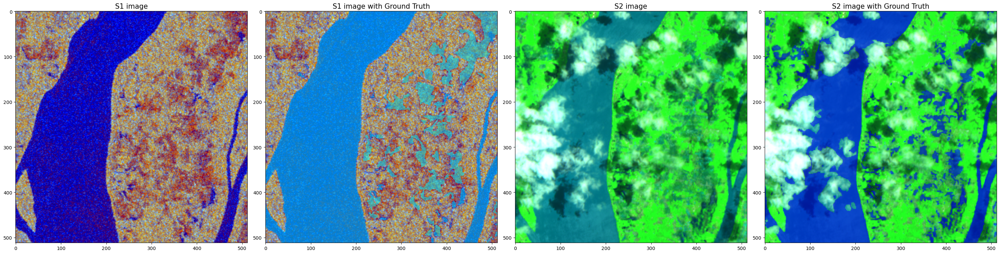

In [4]:
# 定义基本路径变量
base_path = "/home/HW/Pein/Floodwater/dataset"

# 使用 base_path 构建 S1_label_paths
S1_label_paths = sorted(glob.glob(f"{base_path}/chips/*/s1/*/LabelWater.tif"))

b_channels = ['B12', 'B7', 'B4']
show_how_many = 1
alpha = 0.5

for k in range(show_how_many):
    rand_int = np.random.randint(len(S1_label_paths))
    S1_label_path = S1_label_paths[rand_int]
    S1_VV_path = S1_label_path.replace("LabelWater.tif", "VV.tif")
    S1_VH_path = S1_label_path.replace("LabelWater.tif", "VH.tif")
    
    # 解析 flood_event 和 position
    path_parts = S1_label_path.split("/")
    flood_event = path_parts[path_parts.index("chips") + 1]
    position = path_parts[-2].split("_")[-1]
    
    # 使用 base_path 构建 S2_label_path
    S2_label_path = glob.glob(f"{base_path}/chips/{flood_event}/s2/*{position}/LabelWater.tif")[0]
    S2_bands_paths = [S2_label_path.replace("LabelWater.tif", f"{channel}.tif") for channel in b_channels]
    
    f, axarr = plt.subplots(1, 4, figsize=(30, 10))

    
    s1_img = visualize_s1_img(S1_VV_path, S1_VH_path)
    axarr[0].imshow(s1_img)
    axarr[0].set_title("S1 image", fontsize=15)

    s2_img = visualize_s2_img(S2_bands_paths)
    axarr[1].imshow(s1_img)  # 这里是否应该是 axarr[1].imshow(s2_img)?
    axarr[1].set_title("S1 image with Ground Truth", fontsize=15)
    
    axarr[2].imshow(s2_img)
    axarr[2].set_title("S2 image", fontsize=15)
    axarr[3].imshow(s2_img)
    axarr[3].set_title("S2 image with Ground Truth", fontsize=15)
         
    label = tifffile.imread(S1_label_path)
    label = np.ma.masked_where(label == 0, label)
    axarr[1].imshow(label, cmap="cool", alpha=alpha)
    
    label = tifffile.imread(S2_label_path)
    label = np.ma.masked_where(label == 0, label)
    axarr[3].imshow(label, cmap="winter", alpha=alpha)
    
    plt.tight_layout()
    plt.show()


### Training 

In [5]:
import torch
import torch.nn as nn
import albumentations
import os
import time
import segmentation_models_pytorch as smp
import glob

In [6]:
train_percentage = 0.7
val_percentage = 0.15
test_percentage = 0.15

# 定义基本路径变量
base_path = "/home/HW/Pein/Floodwater/dataset"

# 使用 base_path 构建 S1_label_paths
S1_label_paths = sorted(glob.glob(f"{base_path}/chips/*/s1/*/LabelWater.tif"))
S1_img_paths = [[path.replace("LabelWater.tif", "VV.tif"), path.replace("LabelWater.tif", "VH.tif")] for path in S1_label_paths]

np.random.seed(1778)
np.random.shuffle(S1_label_paths)
np.random.seed(1778)
np.random.shuffle(S1_img_paths)

S1_img_paths_train = S1_img_paths[: int(train_percentage * len(S1_img_paths))]
S1_img_paths_val = S1_img_paths[int(train_percentage * len(S1_img_paths)): int((train_percentage + val_percentage) * len(S1_img_paths))]
S1_img_paths_test = S1_img_paths[int((train_percentage + val_percentage) * len(S1_img_paths)):]

S1_label_paths_train = S1_label_paths[: int(train_percentage * len(S1_label_paths))]
S1_label_paths_val = S1_label_paths[int(train_percentage * len(S1_label_paths)): int((train_percentage + val_percentage) * len(S1_label_paths))]
S1_label_paths_test = S1_label_paths[int((train_percentage + val_percentage) * len(S1_label_paths)):]

print(f"Train has {len(S1_img_paths_train)} images and {len(S1_label_paths_train)} labels")
print(f"Val   has {len(S1_img_paths_val)} images and {len(S1_label_paths_val)} labels")
print(f"Test  has {len(S1_img_paths_test)} images and {len(S1_label_paths_test)} labels")

Train has 630 images and 630 labels
Val   has 135 images and 135 labels
Test  has 135 images and 135 labels


### Create PyTorch datasets and normalize 

In [7]:
class Sentinel1_Dataset(torch.utils.data.Dataset):
    def __init__(
        self,
        img_paths,
        mask_paths,
        transforms=None,
        min_normalize=-77,
        max_normalize=26,
    ):
        self.img_paths = img_paths
        self.mask_paths = mask_paths
        self.transforms = transforms
        self.min_normalize = min_normalize
        self.max_normalize = max_normalize

    def __getitem__(self, idx):
        # Load in image
        arr_x = []
        for path in self.img_paths[idx]:
            arr_x.append(tifffile.imread(path))
        arr_x = np.stack(arr_x, axis=-1)

        # Min-Max Normalization
        arr_x = np.clip(arr_x, self.min_normalize, self.max_normalize)
        arr_x = (arr_x - self.min_normalize) / (self.max_normalize - self.min_normalize)

        sample = {"image": arr_x}

        # Load in label mask
        sample["mask"] = tifffile.imread(self.mask_paths[idx])

        # Apply Data Augmentation
        if self.transforms:
            sample = self.transforms(image=sample["image"], mask=sample["mask"])
        if sample["image"].shape[-1] < 20:
            sample["image"] = sample["image"].transpose((2, 0, 1))

        return sample

    def __len__(self):
        return len(self.img_paths)

    def visualize(self, how_many=1, show_specific_index=None):
        for _ in range(how_many):
            rand_int = np.random.randint(len(self.img_paths))
            if show_specific_index is not None:
                rand_int = show_specific_index
            print(self.img_paths[rand_int][0])
            f, axarr = plt.subplots(1, 3, figsize=(30, 9))
            axarr[0].imshow(visualize_s1_img(self.img_paths[rand_int][0], self.img_paths[rand_int][1]))
            sample = self.__getitem__(rand_int)

            img = sample["image"]
            axarr[0].set_title(f"FCC of original S1 image", fontsize=15)
            axarr[1].imshow(img[0]) # Just visualize the VV band here
            axarr[1].set_title(f"VV band returned from the dataset, Min: {img.min():.4f}, Max: {img.max():.4f}", fontsize=15)
            if "mask" in sample.keys():
                axarr[2].set_title(f"Corresponding water mask: {(sample['mask'] == 1).sum()} px", fontsize=15)
                mask = mask_to_img(sample["mask"], {1: (0, 0, 255)})
                axarr[2].imshow(mask)
            plt.tight_layout()
            plt.show()
            
def mask_to_img(label, color_dict):
    """Recodes a (H,W) mask to a (H,W,3) RGB image according to color_dict"""
    mutually_exclusive = np.zeros(label.shape + (3,), dtype=np.uint8)
    for key in range(1, len(color_dict.keys()) + 1):
        mutually_exclusive[label == key] = color_dict[key]
    return mutually_exclusive

### Data augmentations like random cropping and random 90 degree rotations, horizontal and vertical flipping

In [8]:
train_crop_size = 256

train_transforms = albumentations.Compose(
    [
        albumentations.RandomCrop(train_crop_size, train_crop_size),
        albumentations.RandomRotate90(),
        albumentations.HorizontalFlip(),
        albumentations.VerticalFlip()
    ]
)

train_dataset = Sentinel1_Dataset(
    S1_img_paths_train,
    S1_label_paths_train,
    transforms=train_transforms,
    min_normalize=-77,
    max_normalize=26,
    )

val_dataset = Sentinel1_Dataset(
    S1_img_paths_val,
    S1_label_paths_val,
    transforms=None,
    min_normalize=-77,
    max_normalize=26,
    )

test_dataset = Sentinel1_Dataset(
    S1_img_paths_test,
    S1_label_paths_test,
    transforms=None,
    min_normalize=-77,
    max_normalize=26,
    )
print(len(train_dataset), len(val_dataset), len(test_dataset))

630 135 135


/home/HW/Pein/Floodwater/dataset/chips/dc70be79-da19-47ee-bdee-4614bc46d610/s1/S1A_IW_GRDH_1SDV_20180507T160449_20180507T160514_021800_025A09_6700_04096-04608/VV.tif


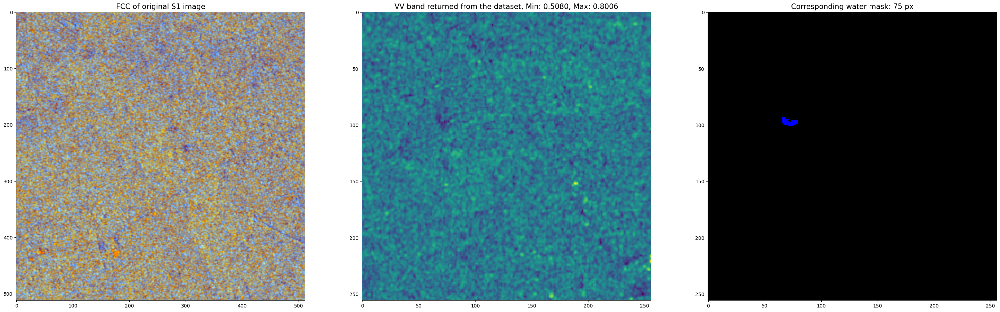

In [9]:
train_dataset.visualize(1)

/home/HW/Pein/Floodwater/dataset/chips/f59da1a3-a2f1-45b8-b975-57af1b344252/s1/S1A_IW_GRDH_1SDV_20190522T002101_20190522T002126_027333_031530_0129_09257-09555/VV.tif


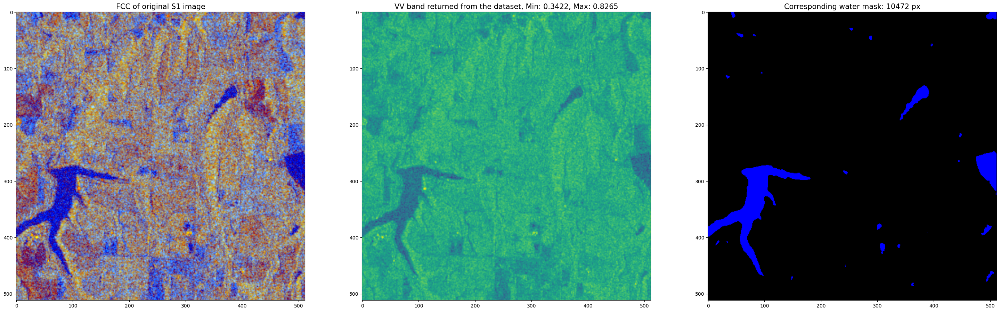

In [10]:
val_dataset.visualize(1)

/home/HW/Pein/Floodwater/dataset/chips/f59da1a3-a2f1-45b8-b975-57af1b344252/s1/S1A_IW_GRDH_1SDV_20190522T002101_20190522T002126_027333_031530_0129_03213-01179/VV.tif


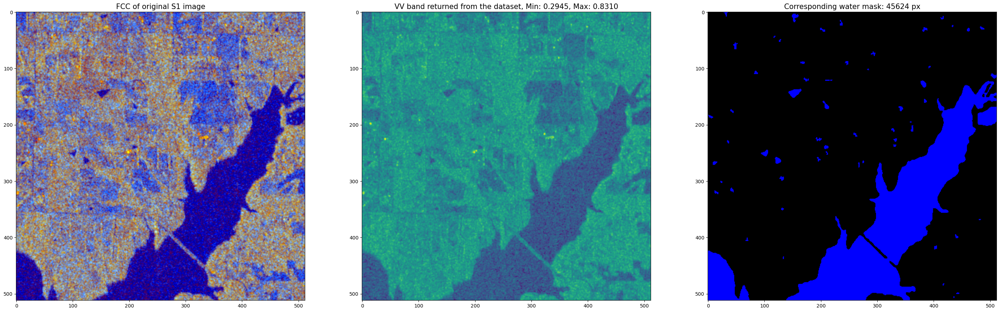

In [11]:
test_dataset.visualize(1)

## Training a pre-trained U-Net segmentation model

In [12]:
num_workers = 2
pin_memory = True

batch_size = 32
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=pin_memory)

val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=pin_memory)

test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=pin_memory)

### Define Loss function
#### choose a standard mixture of 50% cross entropy, 50% dice loss which improves learning in the unbalanced class setting we are in (much more non-water than water)

In [13]:
EPS = 1e-7

class XEDiceLoss(nn.Module):
    """
    Mixture of alpha * CrossEntropy and (1 - alpha) * DiceLoss.
    """
    def __init__(self, alpha=0.5):
        super().__init__()
        self.xe = nn.CrossEntropyLoss()
        self.alpha = alpha

    def forward(self, preds, targets):
        xe_loss = self.xe(preds, targets)
        
        no_ignore = targets.ne(255)
        targets = targets.masked_select(no_ignore)

        preds = torch.softmax(preds, dim=1)[:, 1]
        preds = preds.masked_select(no_ignore)  # 确保 preds 的形状与处理后的 targets 相匹配

        targets = (targets == 1).float()

        dice_loss = 1 - (2.0 * torch.sum(preds * targets)) / (torch.sum(preds + targets) + EPS)

        return self.alpha * xe_loss + (1 - self.alpha) * dice_loss

    def get_name(self):
        return "XEDiceLoss"

### Validation metric

In [14]:
def tp_fp_fn(preds, targets):
    tp = torch.sum(preds * targets)
    fp = torch.sum(preds) - tp
    fn = torch.sum(targets) - tp
    return tp.item(), fp.item(), fn.item()

In [15]:
class AverageMeter(object):
    """
    Computes and stores the average and current value
    Adapted from https://github.com/pytorch/examples/blob/master/imagenet/main.py
    """

    def __init__(self):
        self.reset()

    def reset(self):
        self.val, self.avg, self.sum, self.count = 0, 0, 0, 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

## Training

In [16]:
import torch
import torch.nn as nn
import torch_npu

In [17]:
experiment_name = "Exp1"
on_npu = torch.npu.is_available()
if on_npu:
    device = 'npu'
backbone = "resnet34"
patience = 4
n_epochs = 1000
lr = 1e-3

In [18]:
early_patience = patience * 3
log_path = f"/home/HW/Pein/Floodwater/trained_models/{experiment_name}"
os.makedirs(log_path, exist_ok=True)

model = smp.Unet(
    encoder_name=backbone,
    encoder_weights="imagenet",
    in_channels=2,
    classes=2
)

# 确保在循环开始前将模型移动到NPU
model = model.to(device)

loss_func = XEDiceLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",
    factor=0.5,
    patience=patience,
    verbose=True,
)

if on_npu:
    model = model.to(device)

In [19]:
save_dict = {"model_name": experiment_name}
best_metric, best_metric_epoch, early_stopping_metric = 0, 0, 0
early_stop_counter, best_val_early_stopping_metric = 0, 0
early_stop_flag, start_time = False, time.time()

for curr_epoch_num in range(1, n_epochs):
    ## Part 1: Training loop with Model weights updating
    model.train()
    torch.set_grad_enabled(True)

    losses, batch_time, data_time = AverageMeter(), AverageMeter(), AverageMeter()
    end = time.time()
    for iter_num, data in enumerate(train_loader):
        data_time.update(time.time() - end)
        x_data = data["image"]
        targets = data["mask"].long()
        if on_npu:
            x_data = data["image"].to(device, non_blocking=True)
            targets = data["mask"].long().to(device, non_blocking=True)

        optimizer.zero_grad()

        preds = model(x_data)
        loss = loss_func(preds, targets)
        loss.backward()
        optimizer.step()

        losses.update(loss.detach().item(), x_data.size(0))

        batch_time.update(time.time() - end)
        end = time.time()

    print(f"Ep: [{curr_epoch_num}] TotalT: {(time.time() - start_time) / 60:.1f} min"
          f", BatchT: {batch_time.avg:.3f}s, DataT: {data_time.avg:.3f}s, Loss: {losses.avg:.4f}")

    ## Part 2: Validation loop to get the current IoU
    model.eval()
    torch.set_grad_enabled(False)

    batch_time, data_time, losses = AverageMeter(), AverageMeter(), AverageMeter()
    tps, fps, fns = 0, 0, 0

    end = time.time()
    for iter_num, data in enumerate(val_loader):
        data_time.update(time.time() - end)
        x_data = data["image"]
        targets = data["mask"].long()
        if on_npu:
            x_data = data["image"].to(device, non_blocking=True)
            targets = data["mask"].long().to(device, non_blocking=True)

        preds = model(x_data)
        loss = loss_func(preds, targets)
        losses.update(loss.detach().item(), x_data.size(0))

        preds = torch.softmax(preds, dim=1)[:, 1]
        preds = (preds > 0.5) * 1

        tp, fp, fn = tp_fp_fn(preds, targets)
        assert tp >= 0 and fp >= 0 and fn >= 0, f"Negative tp/fp/fn: tp: {tp}, fp: {fp}, fn: {fn}"
        tps += tp
        fps += fp
        fns += fn

        batch_time.update(time.time() - end)
        end = time.time()

    iou_global = tps / (tps + fps + fns)

    ## When validation IoU improved, save model. If not, increment the lr scheduler and early stopping counters
    early_stopping_metric = iou_global
    if curr_epoch_num > 6:
        scheduler.step(early_stopping_metric)

    print(f"Ep: [{curr_epoch_num}] ValT: {(batch_time.avg * len(val_loader)) / 60:.1f} min, BatchT: {batch_time.avg:.3f}s, "
          f"DataT: {data_time.avg:.3f}s, Loss: {losses.avg:.4f}, Global IoU: {iou_global:.4f} (val)")

    if early_stopping_metric > best_metric:
        best_metric, best_metric_epoch = early_stopping_metric, curr_epoch_num
        save_dict.update(
            {
                "best_metric": best_metric,
                "epoch_num": curr_epoch_num,
                "model_state_dict": model.state_dict(),
                "optim_state_dict": optimizer.state_dict(),
            }
        )

        old_model = glob.glob(f"{log_path}/best_iou*")  # delete old best model
        if len(old_model) > 0:
            os.remove(old_model[0])

        save_path = f"{log_path}/best_iou_{curr_epoch_num}_{best_metric:.4f}.pt"
        torch.save(save_dict, save_path)

    # Early Stopping (ES): Increment stop counter if metric didn't improve
    if early_stopping_metric < best_val_early_stopping_metric:
        early_stop_counter += 1  
    else:
        # reset ES counters
        best_val_early_stopping_metric, early_stop_counter = early_stopping_metric, 0

    # ES: Stop when stop counter reaches ES patience
    if early_stop_counter > early_patience:
        print("Early Stopping")
        break
# torch.cuda.empty_cache()

print(f"Best validation IoU of {best_metric:.5f} in epoch {best_metric_epoch}.")

Ep: [1] TotalT: 10.9 min, BatchT: 32.788s, DataT: 0.286s, Loss: 0.3704
